# NewMet Data Week 4 Progress Report

1. Finish merging
2. Explore Data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import collections as cl
import itertools as it
import seaborn as sns
from sklearn import preprocessing
import datetime

%matplotlib inline
#list all parameters by "print(plt.rcParams)" command
plt.rcParams['figure.figsize'] = (7.5, 7.5)
plt.rcParams['font.size'] = 15
plt.rcParams['axes.grid'] = True
plt.rcParams['figure.facecolor'] = 'w'

# sns.set_style("ticks", {"xtick.major.size": 8, "ytick.major.size": 8})
sns.set(font_scale=1.5)

## 1. Data Integration

In [2]:
df_1 = pd.read_csv('./data/mike_final_big_cleaner.csv')
df_1.pop('Unnamed: 0')
df_1.pop('Unnamed: 0.1')
df_1.pop('Id_x')
df_1.pop('Id2_x')
df_1['Jurisdiction'] = df_1['Jurisdiction'].str.strip()
df_1#[df_1.duplicated(subset='Jurisdiction')]
# df_1#['Jurisdiction']

,Jurisdiction,Total; Estimate; Workers 16 years and over,"Total; Estimate; MEANS OF TRANSPORTATION TO WORK - Car, truck, or van","Total; Estimate; MEANS OF TRANSPORTATION TO WORK - Car, truck, or van - Drove alone","Total; Estimate; MEANS OF TRANSPORTATION TO WORK - Car, truck, or van - Carpooled","Total; Estimate; MEANS OF TRANSPORTATION TO WORK - Car, truck, or van - Carpooled - In 2-person carpool","Total; Estimate; MEANS OF TRANSPORTATION TO WORK - Car, truck, or van - Carpooled - In 3-person carpool","Total; Estimate; MEANS OF TRANSPORTATION TO WORK - Car, truck, or van - Carpooled - In 4-or-more person carpool","Total; Estimate; MEANS OF TRANSPORTATION TO WORK - Car, truck, or van - Workers per car, truck, or van",Total; Estimate; MEANS OF TRANSPORTATION TO WORK - Public transportation (excluding taxicab),...,Total; Estimate; POVERTY RATE FOR THE POPULATION 25 YEARS AND OVER FOR WHOM POVERTY STATUS IS DETERMINED BY EDUCATIONAL ATTAINMENT LEVEL - High school graduate (includes equivalency),Total; Estimate; POVERTY RATE FOR THE POPULATION 25 YEARS AND OVER FOR WHOM POVERTY STATUS IS DETERMINED BY EDUCATIONAL ATTAINMENT LEVEL - Some college or associate's degree,Total; Estimate; POVERTY RATE FOR THE POPULATION 25 YEARS AND OVER FOR WHOM POVERTY STATUS IS DETERMINED BY EDUCATIONAL ATTAINMENT LEVEL - Bachelor's degree or higher,Total; Estimate; MEDIAN EARNINGS IN THE PAST 12 MONTHS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Population 25 years and over with earnings,Total; Estimate; MEDIAN EARNINGS IN THE PAST 12 MONTHS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Population 25 years and over with earnings - Less than high school graduate,Total; Estimate; MEDIAN EARNINGS IN THE PAST 12 MONTHS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Population 25 years and over with earnings - High school graduate (includes equivalency),Total; Estimate; MEDIAN EARNINGS IN THE PAST 12 MONTHS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Population 25 years and over with earnings - Some college or associate's degree,Total; Estimate; MEDIAN EARNINGS IN THE PAST 12 MONTHS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Population 25 years and over with earnings - Bachelor's degree,Total; Estimate; MEDIAN EARNINGS IN THE PAST 12 MONTHS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Population 25 years and over with earnings - Graduate or professional degree,Total; Estimate; PERCENT IMPUTED - Educational attainment
0,Acalanes Ridge,559,61.9,55.3,6.6,6.6,0.0,0.0,1.05,22.0,...,18.7,0.0,0.0,51069,-,18188,27788,52188,120781,2.2
1,Acampo,527,78.6,28.8,49.7,49.7,0.0,0.0,N,0.0,...,0.0,0.0,0.0,28704,23684,-,35714,-,-,0.0
2,Acton,3279,89.4,80.1,9.3,5.1,0.7,3.5,1.07,0.9,...,7.7,9.7,6.1,44492,26250,33875,46250,78889,70375,5.6
3,Adelanto,7360,91.0,74.4,16.6,12.6,2.9,1.0,1.11,1.5,...,28.3,23.2,10.7,30478,21486,29979,36868,42054,22193,8.2
4,Adin,99,96.0,67.7,28.3,28.3,0.0,0.0,1.19,0.0,...,0.0,6.1,17.9,27422,-,-,19583,-,-,2.3
5,Agoura Hills,10083,87.4,81.1,6.4,6.0,0.3,0.1,1.04,0.8,...,7.6,9.3,1.0,61121,16178,31687,42832,71862,100640,3.0
6,Agua Dulce,1379,80.9,69.0,11.8,11.8,0.0,0.0,1.08,0.0,...,0.9,3.5,1.2,47386,26494,76389,35577,51731,62361,1.3
7,Aguanga,343,58.3,47.5,10.8,5.0,5.8,0.0,1.11,0.0,...,0.0,14.6,0.0,36750,26604,42866,36893,-,-,4.9
8,Ahwahnee,642,100.0,93.1,6.9,4.7,2.2,0.0,1.04,0.0,...,0.0,0.0,1.1,56827,-,42262,83575,-,-,0.0
9,Airport,507,90.7,75.1,15.6,12.0,0.0,3.6,1.11,0.0,...,32.2,0.0,0.0,22014,16213,34184,60129,-,-,2.9


In [3]:
# df_1[df_1['Jurisdiction'] == 'Burbank'] #drop 167,418, 545, 765, 917, 1014, 1145
# df_1[df_1['Jurisdiction'] == 'El Cerrito']
# df_1[df_1['Jurisdiction'] == 'Greenfield']
# df_1[df_1['Jurisdiction'] == 'Live Oak']
# df_1[df_1['Jurisdiction'] == 'Mountain View']
# df_1[df_1['Jurisdiction'] == 'Paradise']
# df_1[df_1['Jurisdiction'] == 'Rolling Hills']
# df_1 = df_1.ix[~[167,418,545,765,917,1014,1145]]

In [4]:
df_1 = df_1.drop(df_1.index[[167,418,545,765,917,1014,1145]])
cl.Counter(df_1.duplicated(subset='Jurisdiction'))

Counter({False: 1510})

In [5]:
df_0 = pd.read_csv('./data/recycling&census_data_from_wendy_merged_data.csv')
df_0.pop('Unnamed: 0')
df_0.pop('Unnamed: 0.1')
# df_0['Population'][df_0['Jurisdiction'] == 'Burbank'] # drop 42, 130,  223, 282
# df_0['Population'][df_0['Jurisdiction'] == 'Greenfield']
# df_0['Population'][df_0['Jurisdiction'] == 'Mountain View']
# df_0['Population'][df_0['Jurisdiction'] == 'Rolling Hills']
df_0 = df_0.drop(df_0.index[[42,130,223,282]])
df_0 = df_0.reset_index()
df_0.pop('index')
df_0

,County,Jurisdiction,Num_RecyclingProg_2007,Target_ResPPD_2007,Annual_ResPPD_2007,Target_EmpPPD_2007,Annual_EmpPPD_2007,Num_RecyclingProg_2008,Target_ResPPD_2008,Annual_ResPPD_2008,...,Vacant_units,For_rent_units,Rented_not_occupied_units,For_sale_units,Sold_not_occupied_units,Seasonal_units,All_other_vacans,VancancyRate,HomeownerVacancyRate,RentalVacancyRate
0,San Bernardino,Adelanto,35,6.9,4.8,40.6,31.7,35,6.9,3.8,...,1277,462,11,323,56,32,393,0.140546,0.066,0.123
1,Los Angeles,Agoura Hills,30,7.0,6.6,15.2,13.1,32,7.0,5.7,...,258,118,7,29,11,36,57,0.034015,0.005,0.068
2,Alameda,Alameda,45,5.5,3.8,21.4,13.8,45,5.5,3.6,...,2228,942,65,164,63,207,787,0.068870,0.011,0.057
3,Alameda,Albany,41,5.0,2.9,19.3,11.0,41,5.0,2.3,...,488,253,21,37,16,43,118,0.061858,0.010,0.062
4,Los Angeles,Alhambra,34,3.8,3.3,14.4,11.9,34,3.8,3.2,...,1698,972,34,162,55,139,336,0.054925,0.013,0.053
5,Orange,Aliso Viejo,31,3.3,2.5,9.4,6.7,34,3.3,2.2,...,663,270,31,135,33,104,90,0.035141,0.012,0.036
6,Alpine,Alpine,25,14.5,13.3,24.0,22.0,25,14.5,11.8,...,288,111,1,73,7,46,50,0.052023,0.020,0.063
7,Modoc,Alturas,33,6.8,7.3,14.5,15.3,33,6.8,6.5,...,169,47,7,20,5,24,66,0.120114,0.028,0.078
8,Amador,Amador City,45,7.7,5.9,24.1,17.4,45,7.7,5.1,...,23,3,0,4,0,11,5,0.212963,0.069,0.088
9,Napa,American Canyon,38,6.9,5.1,42.5,28.1,38,6.9,4.3,...,325,48,6,120,38,27,86,0.054330,0.026,0.038


In [6]:
join_df = pd.merge(df_0, df_1, on='Jurisdiction', how='left')
cl.Counter(join_df.duplicated(subset='Jurisdiction'))
# join_df[join_df['Jurisdiction'] == 'Burbank']
# count = 0
# for col in join_df['Jurisdiction']:
#     print col
#     count += 1
# print count

Counter({False: 378})

In [7]:
join_df['County'].unique().size

50

In [8]:
df_2 = pd.read_csv('./data/Ankoor_merged_data.csv')
df_2.pop('Unnamed: 0')
df_2
# for col in df_1.columns:
#     print col

,County_x,Jurisdiction,Count_1995,1995_Prgm_1,1995_Prgm_2,1995_Prgm_3,1995_Prgm_4,1995_Prgm_5,1995_Prgm_6,1995_Prgm_7,...,Burglary_2013,VehicleTheft_2013,Larceny_2013,Arson_2013,TotCrimes_2013,City_y,SolarUnitCount,County,Pop_2010,Area_SqMi
0,Alameda,Alameda,36,0,0,1,0,1,0,1,...,287,330,1285,17,6150,NaN,NaN,NaN,NaN,NaN
1,Alameda,Alameda-Unincorporated,39,1,0,1,0,1,0,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Alameda,Albany,36,0,0,1,0,1,0,1,...,94,75,388,7,3192,Albany,103,Alameda,18539,1.79
3,Alameda,Berkeley,38,1,0,1,0,1,0,1,...,1055,664,3658,16,13907,Berkeley,856,Alameda,112580,10.47
4,Alameda,Dublin,38,1,0,1,0,1,1,1,...,168,77,494,5,3636,Dublin,223,Alameda,46036,14.91
5,Alameda,Emeryville,39,0,0,1,0,1,0,1,...,135,154,1362,2,5581,Emeryville,23,Alameda,10080,1.25
6,Alameda,Fremont,38,0,0,1,0,1,0,0,...,944,669,2484,21,10774,Fremont,725,Alameda,214089,77.46
7,Alameda,Hayward,32,0,0,1,0,1,0,1,...,1051,1671,2122,21,12900,Hayward,299,Alameda,144186,45.32
8,Alameda,Livermore,41,1,0,1,0,1,1,1,...,387,168,1275,15,6228,Livermore,932,Alameda,80968,25.17
9,Alameda,Newark,38,1,0,1,0,1,0,1,...,231,173,658,2,4385,Newark,76,Alameda,42573,13.87


In [9]:
df_2['Jurisdiction'] = df_2['Jurisdiction'].str.replace('-Unincorporated','')
df_2 = df_2.drop_duplicates(subset='Jurisdiction')
df_2 = df_2.sort(columns='Jurisdiction')
df_2 = df_2.reset_index()
df_2.pop('index')
df_2

,County_x,Jurisdiction,Count_1995,1995_Prgm_1,1995_Prgm_2,1995_Prgm_3,1995_Prgm_4,1995_Prgm_5,1995_Prgm_6,1995_Prgm_7,...,Burglary_2013,VehicleTheft_2013,Larceny_2013,Arson_2013,TotCrimes_2013,City_y,SolarUnitCount,County,Pop_2010,Area_SqMi
0,San Bernardino,Adelanto,32,0,0,1,0,1,0,1,...,381,133,372,17,4198,Adelanto,60,San Bernardino,31765,56.01
1,Los Angeles,Agoura Hills,28,1,0,1,0,1,0,0,...,109,12,185,7,2670,Agoura Hills,399,Los Angeles,20330,7.79
2,Alameda,Alameda,36,0,0,1,0,1,0,1,...,287,330,1285,17,6150,NaN,NaN,NaN,NaN,NaN
3,Alameda,Albany,36,0,0,1,0,1,0,1,...,94,75,388,7,3192,Albany,103,Alameda,18539,1.79
4,Los Angeles,Alhambra,31,1,0,1,0,1,0,1,...,344,234,1196,7,5894,Alhambra,118,Los Angeles,83089,7.63
5,Orange,Aliso Viejo,0,0,0,0,0,0,0,0,...,71,20,224,3,2696,Aliso Viejo,196,Orange,47823,7.47
6,Alpine,Alpine,27,0,0,1,0,0,0,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,Modoc,Alturas,46,1,0,1,0,0,1,1,...,23,2,46,0,2211,NaN,NaN,NaN,NaN,NaN
8,Amador,Amador,35,1,1,1,1,1,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,Amador,Amador City,35,1,1,1,1,1,0,0,...,NaN,NaN,NaN,NaN,NaN,Amador City,2,Amador,185,0.31


In [10]:
count = 0
for col in df_2['Jurisdiction']:
    if len(col.split(' ')) > 2:
        print col
    count += 1
print count

Amador County Integrated Solid Waste Management Agency
Big Bear Lake
Butte County Regional Waste Management Authority
Calaveras County Regional Agency
Central Contra Costa Solid Waste Authority (CCCSWA)
Colusa County Regional Agency
Consolidated Waste Management Authority
Contra Costa/Ironhouse/Oakley Regional Agency
Del Norte Solid Waste Management Authority
Del Rey Oaks
Desert Hot Springs
East Palo Alto
El Paso De Robles
Glenn County Waste Management Regional Agency
Half Moon Bay
Imperial Valley Resource Management Agency
Inyo Regional Waste Management Agency
Kings Waste and Recycling Authority
La Canada Flintridge
La Habra Heights
Lassen Regional Solid Waste Management Authority
Los Altos Hills
Los Angeles Area Integrated Waste Management Authority
Marin County Hazardous and Solid Waste Management Authority
Merced County Solid Waste Regional Agency
Palos Verdes Estates
Rancho Palos Verdes
Rancho Santa Margarita
Rolling Hills Estates
Sacramento County/City of Citrus Heights Regional 

In [11]:
for col in join_df['Jurisdiction']:
    print col

Adelanto
Agoura Hills
Alameda
Albany
Alhambra
Aliso Viejo
Alpine
Alturas
Amador City
American Canyon
Anaheim
Antioch
Apple Valley
Arcadia
Arcata
Arvin
Atherton
Auburn
Avalon
Avenal
Azusa
Bakersfield
Baldwin Park
Banning
Barstow
Beaumont
Bell
Bell Gardens
Bellflower
Belmont
Benicia
Berkeley
Big Bear Lake
Blue Lake
Blythe
Bradbury
Brea
Brentwood
Brisbane
Buellton
Buena Park
Burbank
Burlingame
Calabasas
California City
Calimesa
Camarillo
Campbell
Canyon Lake
Capitola
Carlsbad
Carmel-by-the-Sea
Carpinteria
Carson
Cathedral City
Cerritos
Chico
Chino
Chino Hills
Chowchilla
Chula Vista
Claremont
Clayton
Clearlake
Clovis
Coachella
Coalinga
Colfax
Colma
Colton
Colusa
Commerce
Compton
Concord
Oakley
Corona
Coronado
Costa Mesa
Covina
Cudahy
Culver City
Cupertino
Cypress
Daly City
Dana Point
Danville
Davis
Del Mar
Del Rey Oaks
Delano
Desert Hot Springs
Diamond Bar
Dixon
Downey
Dublin
East Palo Alto
El Cajon
El Dorado Hills
El Monte
El Segundo
Elk Grove
Emeryville
Encinitas
Escalon
Escondido
Eureka

In [12]:
df_2['Jurisdiction'] = df_2['Jurisdiction'].str.replace(' (Resource|County|Waste|Solid|Integrated|Regional) (\w+\s)*(Authority|Agency)','')
df_2['Jurisdiction'] = df_2['Jurisdiction'].str.replace('Contra Costa/Ironhouse/','')
df_2['Jurisdiction'] = df_2['Jurisdiction'].str.replace(' Regional Integrated Waste Mgmgt. Reporting Authority','')
df_2['Jurisdiction'] = df_2['Jurisdiction'].str.strip()
df_2 = df_2.drop_duplicates(subset='Jurisdiction', take_last=True)
count = 0
for col in df_2['Jurisdiction']:
    print col
    count += 1
print count

Adelanto
Agoura Hills
Alameda
Albany
Alhambra
Aliso Viejo
Alpine
Alturas
Amador City
Amador
American Canyon
Anaheim
Anderson
Angels Camp
Antioch
Apple Valley
Arcadia
Arcata
Arroyo Grande
Artesia
Arvin
Atascadero
Atherton
Auburn
Avalon
Avenal
Azusa
Bakersfield
Baldwin Park
Banning
Barstow
Beaumont
Bell
Bell Gardens
Bellflower
Belmont
Benicia
Berkeley
Beverly Hills
Big Bear Lake
Biggs
Blue Lake
Blythe
Bradbury
Brawley
Brea
Brentwood
Brisbane
Buellton
Buena Park
Burbank
Burlingame
Butte
Calabasas
Calaveras
Calexico
California City
Calimesa
Calipatria
Camarillo
Campbell
Canyon Lake
Capitola
Carlsbad
Carmel-by-the-Sea
Carpinteria
Carson
Cathedral City
Central Contra Costa (CCCSWA)
Ceres
Cerritos
Chico
Chino
Chino Hills
Chowchilla
Chula Vista
Citrus Heights
Claremont
Clayton
Clearlake
Clovis
Coachella
Coalinga
Colfax
Colma
Colton
Colusa
Commerce
Compton
Concord
Consolidated
Contra Costa
Corona
Coronado
Costa Mesa
Covina
Cudahy
Culver City
Cupertino
Cypress
Daly City
Dana Point
Danville
Davis

In [13]:
df_2[df_2['Jurisdiction'] == 'Tuolumne']

,County_x,Jurisdiction,Count_1995,1995_Prgm_1,1995_Prgm_2,1995_Prgm_3,1995_Prgm_4,1995_Prgm_5,1995_Prgm_6,1995_Prgm_7,...,Burglary_2013,VehicleTheft_2013,Larceny_2013,Arson_2013,TotCrimes_2013,City_y,SolarUnitCount,County,Pop_2010,Area_SqMi
431,Tuolumne,Tuolumne,38,0,1,1,1,1,0,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
df_2.ix[123,'Jurisdiction'] = 'El Dorado Hills'
df_2.ix[175,'Jurisdiction'] = 'Humboldt Hill'
df_2.ix[186,'Jurisdiction'] = 'Inyokern'
df_2.ix[244,'Jurisdiction'] = 'Marin City'
df_2.ix[260,'Jurisdiction'] = 'Mono City'
df_2.ix[317,'Jurisdiction'] = 'Plumas Eureka'
df_2.ix[396,'Jurisdiction'] = 'Sierra City'
df_2.ix[428,'Jurisdiction'] = 'Trinity Center'
df_2.ix[431,'Jurisdiction'] = 'Tuolumne City'

C:\Users\SangSeo\Anaconda\lib\site-packages\pandas\core\indexing.py:415: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [15]:
cl.Counter(join_df['Jurisdiction'].isin(df_2['Jurisdiction']))
join_df[~join_df['Jurisdiction'].isin(df_2['Jurisdiction'])]

,County,Jurisdiction,Num_RecyclingProg_2007,Target_ResPPD_2007,Annual_ResPPD_2007,Target_EmpPPD_2007,Annual_EmpPPD_2007,Num_RecyclingProg_2008,Target_ResPPD_2008,Annual_ResPPD_2008,...,Total; Estimate; POVERTY RATE FOR THE POPULATION 25 YEARS AND OVER FOR WHOM POVERTY STATUS IS DETERMINED BY EDUCATIONAL ATTAINMENT LEVEL - High school graduate (includes equivalency),Total; Estimate; POVERTY RATE FOR THE POPULATION 25 YEARS AND OVER FOR WHOM POVERTY STATUS IS DETERMINED BY EDUCATIONAL ATTAINMENT LEVEL - Some college or associate's degree,Total; Estimate; POVERTY RATE FOR THE POPULATION 25 YEARS AND OVER FOR WHOM POVERTY STATUS IS DETERMINED BY EDUCATIONAL ATTAINMENT LEVEL - Bachelor's degree or higher,Total; Estimate; MEDIAN EARNINGS IN THE PAST 12 MONTHS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Population 25 years and over with earnings,Total; Estimate; MEDIAN EARNINGS IN THE PAST 12 MONTHS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Population 25 years and over with earnings - Less than high school graduate,Total; Estimate; MEDIAN EARNINGS IN THE PAST 12 MONTHS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Population 25 years and over with earnings - High school graduate (includes equivalency),Total; Estimate; MEDIAN EARNINGS IN THE PAST 12 MONTHS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Population 25 years and over with earnings - Some college or associate's degree,Total; Estimate; MEDIAN EARNINGS IN THE PAST 12 MONTHS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Population 25 years and over with earnings - Bachelor's degree,Total; Estimate; MEDIAN EARNINGS IN THE PAST 12 MONTHS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Population 25 years and over with earnings - Graduate or professional degree,Total; Estimate; PERCENT IMPUTED - Educational attainment


In [16]:
join_df2 = pd.merge(join_df ,df_2, on='Jurisdiction', how='left')
join_df2.pop('Id_y')
join_df2.pop('Id2_y')
join_df2.pop('Id')
join_df2.pop('Id2')
join_df2

,County_x,Jurisdiction,Num_RecyclingProg_2007,Target_ResPPD_2007,Annual_ResPPD_2007,Target_EmpPPD_2007,Annual_EmpPPD_2007,Num_RecyclingProg_2008,Target_ResPPD_2008,Annual_ResPPD_2008,...,Burglary_2013,VehicleTheft_2013,Larceny_2013,Arson_2013,TotCrimes_2013,City_y,SolarUnitCount,County_y,Pop_2010,Area_SqMi
0,San Bernardino,Adelanto,35,6.9,4.8,40.6,31.7,35,6.9,3.8,...,381,133,372,17,4198,Adelanto,60,San Bernardino,31765,56.01
1,Los Angeles,Agoura Hills,30,7.0,6.6,15.2,13.1,32,7.0,5.7,...,109,12,185,7,2670,Agoura Hills,399,Los Angeles,20330,7.79
2,Alameda,Alameda,45,5.5,3.8,21.4,13.8,45,5.5,3.6,...,287,330,1285,17,6150,NaN,NaN,NaN,NaN,NaN
3,Alameda,Albany,41,5.0,2.9,19.3,11.0,41,5.0,2.3,...,94,75,388,7,3192,Albany,103,Alameda,18539,1.79
4,Los Angeles,Alhambra,34,3.8,3.3,14.4,11.9,34,3.8,3.2,...,344,234,1196,7,5894,Alhambra,118,Los Angeles,83089,7.63
5,Orange,Aliso Viejo,31,3.3,2.5,9.4,6.7,34,3.3,2.2,...,71,20,224,3,2696,Aliso Viejo,196,Orange,47823,7.47
6,Alpine,Alpine,25,14.5,13.3,24.0,22.0,25,14.5,11.8,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,Modoc,Alturas,33,6.8,7.3,14.5,15.3,33,6.8,6.5,...,23,2,46,0,2211,NaN,NaN,NaN,NaN,NaN
8,Amador,Amador City,45,7.7,5.9,24.1,17.4,45,7.7,5.1,...,NaN,NaN,NaN,NaN,NaN,Amador City,2,Amador,185,0.31
9,Napa,American Canyon,38,6.9,5.1,42.5,28.1,38,6.9,4.3,...,91,32,387,2,3143,American Canyon,63,Napa,19454,4.84


In [17]:
for col in join_df2.columns:
    print col

County_x
Jurisdiction
Num_RecyclingProg_2007
Target_ResPPD_2007
Annual_ResPPD_2007
Target_EmpPPD_2007
Annual_EmpPPD_2007
Num_RecyclingProg_2008
Target_ResPPD_2008
Annual_ResPPD_2008
Target_EmpPPD_2008
Annual_EmpPPD_2008
Num_RecyclingProg_2009
Target_ResPPD_2009
Annual_ResPPD_2009
Target_EmpPPD_2009
Annual_EmpPPD_2009
Num_RecyclingProg_2010
Target_ResPPD_2010
Annual_ResPPD_2010
Target_EmpPPD_2010
Annual_EmpPPD_2010
Num_RecyclingProg_2011
Target_ResPPD_2011
Annual_ResPPD_2011
Target_EmpPPD_2011
Annual_EmpPPD_2011
Num_RecyclingProg_2012
Target_ResPPD_2012
Annual_ResPPD_2012
Target_EmpPPD_2012
Annual_EmpPPD_2012
Num_RecyclingProg_2013
Target_ResPPD_2013
Annual_ResPPD_2013
Target_EmpPPD_2013
Annual_EmpPPD_2013
Population
Male
Female
MedianAgeYears
MaleMedianAgeYears
FemaleMedianAgeYears
AverageHouseholdSize
AverageFamilySize
PersonsUnder5Years
PersonsUnder18Years
PersonsAge21Plus
PersonsAge55Plus
PersonsAge60Plus
PersonsAge65Plus
PercentPopulationFemale
PercentPopulationLessThan18
Populatio

In [18]:
# print cl.Counter(pd.isnull(df_2['Area_SqMi']))
# cl.Counter(pd.isnull(join_df2['Area_SqMi']))
# join_df2['Id2']
df_2[df_2.duplicated(subset='Jurisdiction')]

,County_x,Jurisdiction,Count_1995,1995_Prgm_1,1995_Prgm_2,1995_Prgm_3,1995_Prgm_4,1995_Prgm_5,1995_Prgm_6,1995_Prgm_7,...,Burglary_2013,VehicleTheft_2013,Larceny_2013,Arson_2013,TotCrimes_2013,City_y,SolarUnitCount,County,Pop_2010,Area_SqMi


In [19]:
# join_df2.to_csv('./data/final_merged_data_by_steve.csv')

## Start to use final dataset

In [20]:
my_df = pd.read_csv('./data/final_merged_data_by_steve.csv')
my_df.pop('Unnamed: 0')
my_df.columns[:37]
# my_df.columns[163:301]

Index([u'County_x', u'Jurisdiction', u'Num_RecyclingProg_2007',
       u'Target_ResPPD_2007', u'Annual_ResPPD_2007', u'Target_EmpPPD_2007',
       u'Annual_EmpPPD_2007', u'Num_RecyclingProg_2008', u'Target_ResPPD_2008',
       u'Annual_ResPPD_2008', u'Target_EmpPPD_2008', u'Annual_EmpPPD_2008',
       u'Num_RecyclingProg_2009', u'Target_ResPPD_2009', u'Annual_ResPPD_2009',
       u'Target_EmpPPD_2009', u'Annual_EmpPPD_2009', u'Num_RecyclingProg_2010',
       u'Target_ResPPD_2010', u'Annual_ResPPD_2010', u'Target_EmpPPD_2010',
       u'Annual_EmpPPD_2010', u'Num_RecyclingProg_2011', u'Target_ResPPD_2011',
       u'Annual_ResPPD_2011', u'Target_EmpPPD_2011', u'Annual_EmpPPD_2011',
       u'Num_RecyclingProg_2012', u'Target_ResPPD_2012', u'Annual_ResPPD_2012',
       u'Target_EmpPPD_2012', u'Annual_EmpPPD_2012', u'Num_RecyclingProg_2013',
       u'Target_ResPPD_2013', u'Annual_ResPPD_2013', u'Target_EmpPPD_2013',
       u'Annual_EmpPPD_2013'],
      dtype='object')

In [21]:
df1 = my_df.ix[:,0:37] # 38 + 139 = 177
df2 = my_df.ix[:,163:299]
# df2
df3 = pd.concat([df1, df2], axis=1)
df3.shape
# for col in df3.columns:
#     print col

(378, 173)

In [22]:
count = 0
for col in df3.columns:
#     if df3[col].dtype == np.object: 
    if '(X)' in df3[col].unique():
#         print col
        df3.pop(col)
        count += 1
print count
df3.shape

20


(378, 153)

In [23]:
# df3.columns[37:52] # Employment Status indice # wrong, please refer word file for correct information
# df3.columns[53:60] # CommutingToWork indice
# df3.columns[61:66] # Occupation indice
# df3.columns[66:80]
# df3.columns[152]

## Exploratory Data Analysis

In [24]:
grouped = df3.groupby('County_x')

In [25]:
res_ppd_by_county = grouped.mean()[['Annual_ResPPD_2007','Annual_ResPPD_2008','Annual_ResPPD_2009',
                                    'Annual_ResPPD_2010','Annual_ResPPD_2011','Annual_ResPPD_2012','Annual_ResPPD_2013']].T
res_ppd_by_county.describe()

,Alameda,Alpine,Amador,Butte,Colusa,Contra Costa,El Dorado,Fresno,Humboldt,Imperial,...,Sierra,Solano,Sonoma,Stanislaus,Tehama,Trinity,Tulare,Tuolumne,Ventura,Yolo
count,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,...,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000
mean,4.391837,9.342857,4.785714,6.585714,5.457143,3.801020,5.857143,4.043571,3.925000,4.671429,...,4.242857,4.663265,4.014286,3.914286,3.842857,3.085714,3.271429,4.771429,4.720635,4.677143
std,0.551350,2.245631,0.622973,1.405262,0.538074,0.503703,0.586488,0.363395,0.226385,0.747695,...,0.547288,0.465610,0.569879,0.501427,0.263674,0.167616,0.521901,0.597813,0.494639,0.485994
min,3.921429,7.600000,4.100000,4.950000,4.400000,3.312500,5.233333,3.705000,3.562500,3.600000,...,3.600000,4.242857,3.400000,3.500000,3.600000,2.900000,2.800000,3.700000,4.411111,4.280000
25%,4.121429,8.050000,4.350000,5.725000,5.300000,3.475000,5.466667,3.792500,3.800000,4.200000,...,3.850000,4.400000,3.600000,3.550000,3.600000,3.000000,2.900000,4.550000,4.433333,4.380000
50%,4.150000,8.300000,4.600000,6.150000,5.600000,3.637500,5.733333,4.050000,3.937500,4.800000,...,4.100000,4.542857,3.900000,3.600000,3.900000,3.000000,3.000000,4.850000,4.455556,4.500000
75%,4.439286,10.050000,5.100000,7.225000,5.800000,3.982143,6.183333,4.095000,4.062500,5.050000,...,4.600000,4.728571,4.300000,4.250000,3.950000,3.150000,3.550000,5.075000,4.800000,4.800000
max,5.550000,13.300000,5.900000,9.100000,6.000000,4.742857,6.733333,4.775000,4.250000,5.800000,...,5.100000,5.600000,5.000000,4.700000,4.300000,3.400000,4.200000,5.600000,5.711111,5.600000


In [26]:
emp_ppd_by_county = grouped.mean()[['Annual_EmpPPD_2007','Annual_EmpPPD_2008','Annual_EmpPPD_2009',
                                  'Annual_EmpPPD_2010','Annual_EmpPPD_2011','Annual_EmpPPD_2012','Annual_EmpPPD_2013']].T
emp_ppd_by_county.describe()

,Alameda,Alpine,Amador,Butte,Colusa,Contra Costa,El Dorado,Fresno,Humboldt,Imperial,...,Sierra,Solano,Sonoma,Stanislaus,Tehama,Trinity,Tulare,Tuolumne,Ventura,Yolo
count,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,...,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000
mean,10.131633,17.314286,15.085714,11.371429,14.042857,15.986820,15.619048,20.208571,21.182143,15.128571,...,22.242857,17.869388,10.985714,11.885714,15.457143,16.228571,17.500000,11.250000,16.360317,11.942857
std,0.892532,3.112571,1.425282,2.117754,2.350785,1.430257,1.162032,1.906049,3.796276,2.715213,...,4.070568,1.587610,1.182411,1.115689,0.896023,1.123557,3.053959,1.096206,1.305762,0.892220
min,9.092857,13.800000,13.400000,9.150000,9.700000,14.337500,14.366667,17.150000,14.125000,11.200000,...,18.000000,16.514286,9.700000,10.000000,14.200000,14.700000,12.600000,10.000000,15.322222,11.100000
25%,9.696429,14.950000,13.950000,9.825000,13.200000,14.750000,14.650000,19.260000,20.475000,13.250000,...,19.450000,16.742857,10.100000,11.300000,14.800000,15.650000,15.900000,10.675000,15.477778,11.230000
50%,10.014286,16.400000,15.100000,10.350000,14.500000,16.192857,15.300000,20.005000,20.862500,15.400000,...,19.900000,17.028571,10.600000,12.200000,15.500000,16.000000,17.900000,10.950000,15.666667,11.720000
75%,10.239286,19.550000,15.900000,12.850000,15.400000,16.895833,16.533333,21.522500,23.325000,17.250000,...,24.950000,18.642857,11.900000,12.550000,16.250000,16.700000,19.150000,11.625000,16.850000,12.520000
max,11.942857,22.000000,17.400000,14.750000,16.900000,18.085714,17.300000,22.740000,25.687500,18.300000,...,29.000000,20.771429,12.600000,13.300000,16.400000,18.200000,21.900000,13.200000,18.877778,13.280000


## Residential Diversion Rate From 2007 to 2013

County_x
Alameda            False
Alpine             False
Amador             False
Butte              False
Colusa             False
Contra Costa       False
El Dorado          False
Fresno             False
Humboldt           False
Imperial           False
Inyo               False
Kern               False
Kings              False
Lake               False
Los Angeles         True
Madera             False
Marin              False
Mariposa           False
Mendocino          False
Merced             False
Modoc              False
Mono               False
Monterey           False
Napa               False
Nevada             False
Orange             False
Placer             False
Plumas             False
Riverside          False
Sacramento         False
San Bernardino     False
San Diego          False
San Francisco      False
San Joaquin        False
San Luis Obispo    False
San Mateo          False
Santa Barbara      False
Santa Clara        False
Santa Cruz         False
Shasta          

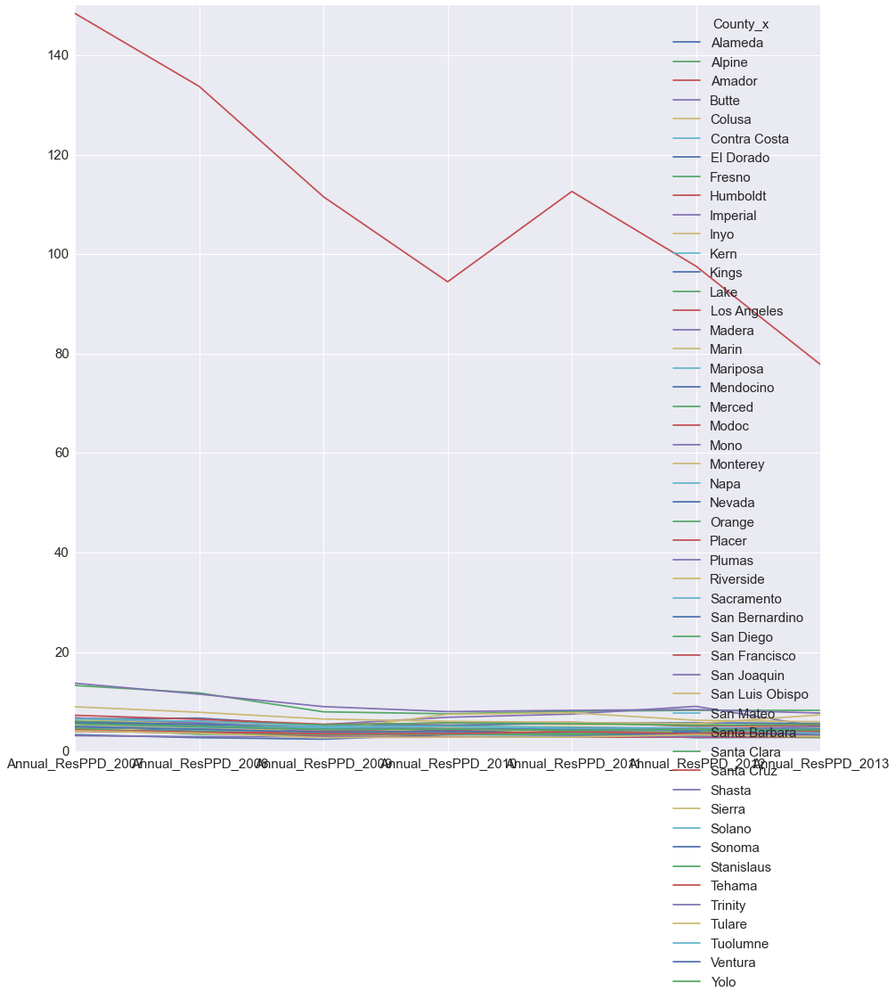

In [27]:
plt.rcParams['figure.figsize'] = (15, 15)
res_ppd_by_county.plot()
plt.ylim(0,150)
print res_ppd_by_county.mean()> 100

(0, 15)

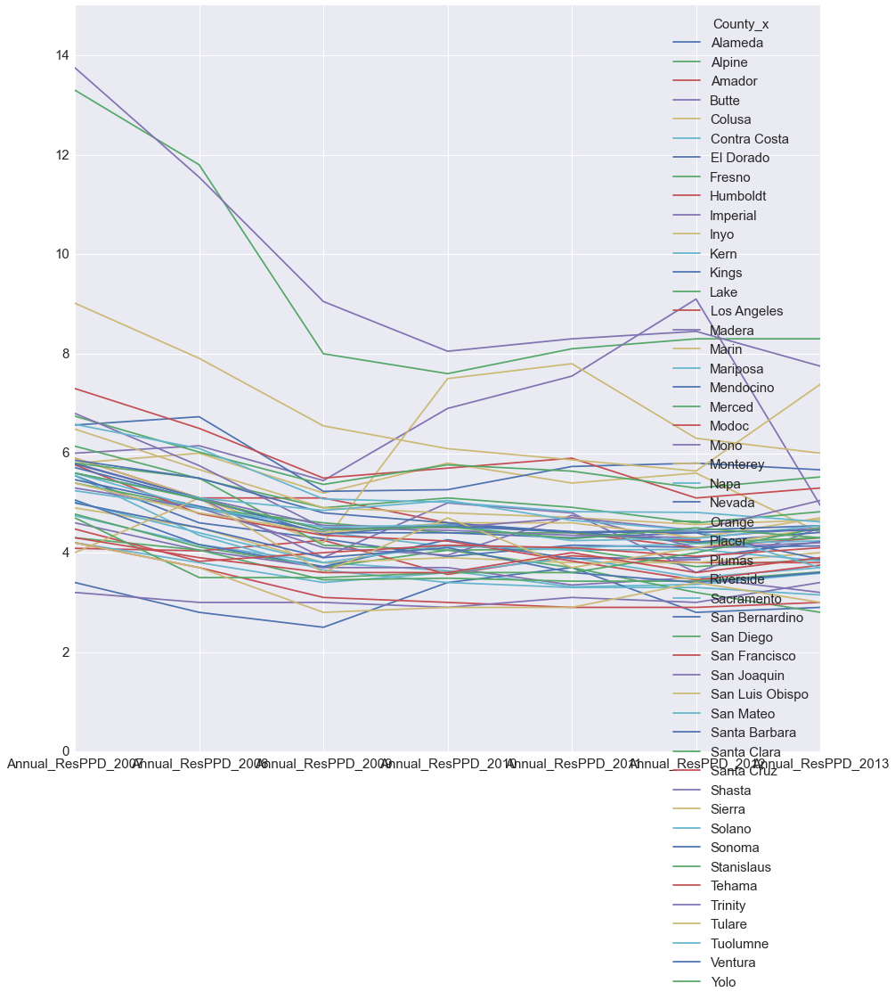

In [28]:
res_ppd_by_county.plot()
plt.ylim(0,15)

## Employment Diversion Rate From 2007 to 2013

(0, 35)

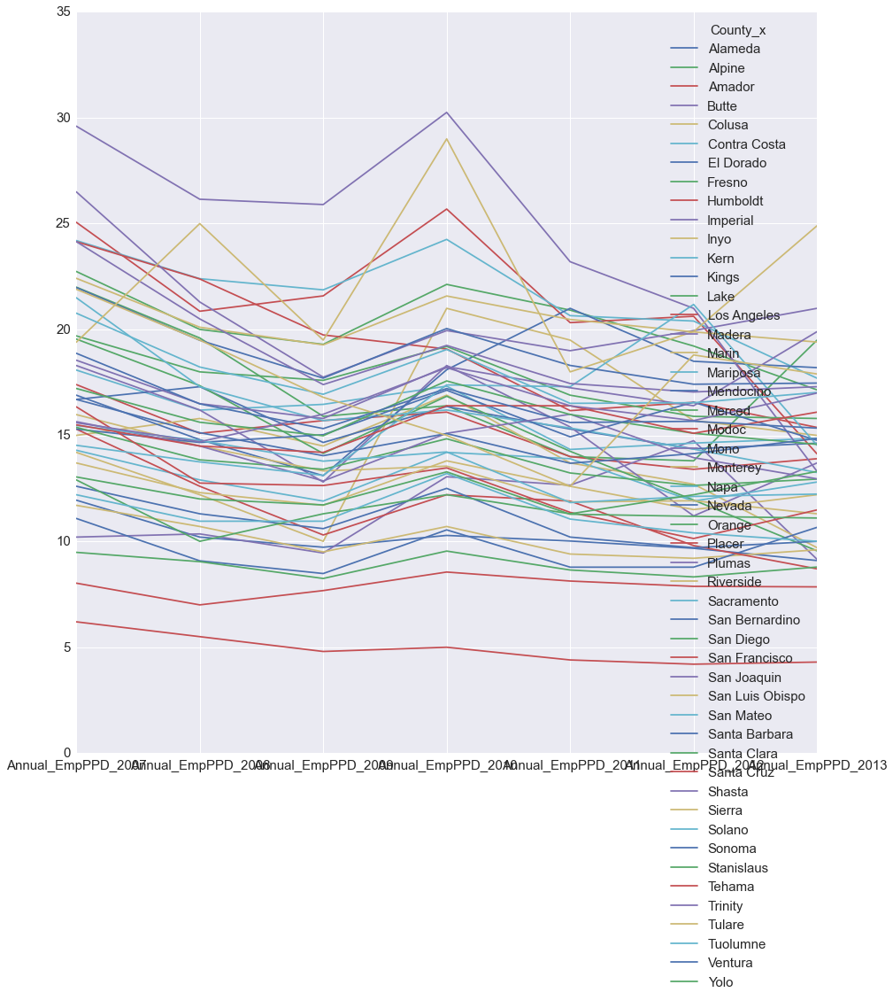

In [29]:
emp_ppd_by_county.plot()
plt.ylim(0,35)

## Compute correlation between similar columns to reduce redundant columns

### Employment Status

In [32]:
# For Employment Status
for col1, col2 in it.combinations(df3.columns[37:52], 2):
#     print col

    # Check all pairs
    corr = df3[col1].corr(df3[col2])
    print 'Col1: {}, Col2: {}'.format(col1[30:], col2[30:])
    print corr

    # Check low correlation value & col
#     if corr < 0.95:  
#         print col2[30:], corr


Col1: Population 16 years and over - In labor force, Col2: Population 16 years and over - In labor force - Civilian labor force
0.999897566286
Col1: Population 16 years and over - In labor force, Col2: Population 16 years and over - In labor force - Civilian labor force - Employed
0.999855959004
Col1: Population 16 years and over - In labor force, Col2: Population 16 years and over - In labor force - Civilian labor force - Unemployed
0.991157759439
Col1: Population 16 years and over - In labor force, Col2: Population 16 years and over - In labor force - Armed Forces
0.325377747094
Col1: Population 16 years and over - In labor force, Col2: Population 16 years and over - Not in labor force
0.997393802586
Col1: Population 16 years and over - In labor force, Col2: Civilian labor force
0.999897566286
Col1: Population 16 years and over - In labor force, Col2: Females 16 years and over
0.999482779643
Col1: Population 16 years and over - In labor force, Col2: Females 16 years and over - In lab

### Commuting To Work

In [33]:
# Convert String column to float column and replace 'N' with 0
df3[df3['Estimate; COMMUTING TO WORK - Mean travel time to work (minutes)'] == 'N'].index.tolist() # 210, 345
df3.iloc[210, 59] = 0.0
df3.iloc[345, 59] = 0.0
df3['Estimate; COMMUTING TO WORK - Mean travel time to work (minutes)'] = df3['Estimate; COMMUTING TO WORK - Mean travel time to work (minutes)'].astype(float)

# Check code
# for i in df3.iloc[:,59]:
#     if i == 'N':
#         print value

In [34]:
# For Commuting To Work
# for col in df3.columns[52:60]:
#     print col
for col1, col2 in it.combinations(df3.columns[52:60], 2):
    # Check all pairs
    corr = df3[col1].corr(df3[col2])
    print 'Col1: {}, Col2: {}'.format(col1[10:], col2[10:])
    print corr

    # Check low correlation value & col
#     if corr < 0.80:  
#         print col1[10:], col2[10:], corr


Col1: COMMUTING TO WORK - Workers 16 years and over, Col2: COMMUTING TO WORK - Workers 16 years and over - Car, truck, or van -- drove alone
0.992671003781
Col1: COMMUTING TO WORK - Workers 16 years and over, Col2: COMMUTING TO WORK - Workers 16 years and over - Car, truck, or van -- carpooled
0.989789457321
Col1: COMMUTING TO WORK - Workers 16 years and over, Col2: COMMUTING TO WORK - Workers 16 years and over - Public transportation (excluding taxicab)
0.868150439271
Col1: COMMUTING TO WORK - Workers 16 years and over, Col2: COMMUTING TO WORK - Workers 16 years and over - Walked
0.912692084777
Col1: COMMUTING TO WORK - Workers 16 years and over, Col2: COMMUTING TO WORK - Workers 16 years and over - Other means
0.939558005147
Col1: COMMUTING TO WORK - Workers 16 years and over, Col2: COMMUTING TO WORK - Workers 16 years and over - Worked at home
0.984616471937
Col1: COMMUTING TO WORK - Workers 16 years and over, Col2: COMMUTING TO WORK - Mean travel time to work (minutes)
0.0582002289

### Occupation

In [35]:
# For Occupation
# for col in df3.columns[60:66]:
#     print col
for col1, col2 in it.combinations(df3.columns[60:66], 2):
    # Check all pairs
    corr = df3[col1].corr(df3[col2])
    print 'Col1: {}, Col2: {}'.format(col1[10:], col2[10:])
    print corr

    # Check low correlation value & col
#     if corr < 0.80:  
#         print col1[10:], col2[10:], corr


Col1: OCCUPATION - Civilian employed population 16 years and over, Col2: OCCUPATION - Civilian employed population 16 years and over - Management, business, science, and arts occupations
0.986239010555
Col1: OCCUPATION - Civilian employed population 16 years and over, Col2: OCCUPATION - Civilian employed population 16 years and over - Service occupations
0.995265666385
Col1: OCCUPATION - Civilian employed population 16 years and over, Col2: OCCUPATION - Civilian employed population 16 years and over - Sales and office occupations
0.998583798968
Col1: OCCUPATION - Civilian employed population 16 years and over, Col2: OCCUPATION - Civilian employed population 16 years and over - Natural resources, construction, and maintenance occupations
0.973624524493
Col1: OCCUPATION - Civilian employed population 16 years and over, Col2: OCCUPATION - Civilian employed population 16 years and over - Production, transportation, and material moving occupations
0.972505817427
Col1: OCCUPATION - Civilian 

### Which industry people are employed (Industry Employment)

In [36]:
# For Which Industry People's Employment
# for col in df3.columns[66:80]:
#     print col
for col1, col2 in it.combinations(df3.columns[66:80], 2):
    # Check all pairs
    corr = df3[col1].corr(df3[col2])
    print 'Col1: {}, Col2: {}'.format(col1[10:], col2[10:])
    print corr

    # Check low correlation value & col
#     if corr < 0.80:  
#         print col1[10:], col2[10:], corr


Col1: INDUSTRY - Civilian employed population 16 years and over, Col2: INDUSTRY - Civilian employed population 16 years and over - Agriculture, forestry, fishing and hunting, and mining
0.33042126036
Col1: INDUSTRY - Civilian employed population 16 years and over, Col2: INDUSTRY - Civilian employed population 16 years and over - Construction
0.988345598742
Col1: INDUSTRY - Civilian employed population 16 years and over, Col2: INDUSTRY - Civilian employed population 16 years and over - Manufacturing
0.960015588574
Col1: INDUSTRY - Civilian employed population 16 years and over, Col2: INDUSTRY - Civilian employed population 16 years and over - Wholesale trade
0.984220421605
Col1: INDUSTRY - Civilian employed population 16 years and over, Col2: INDUSTRY - Civilian employed population 16 years and over - Retail trade
0.997893263323
Col1: INDUSTRY - Civilian employed population 16 years and over, Col2: INDUSTRY - Civilian employed population 16 years and over - Transportation and warehousin

### Class of Workers

In [37]:
# For Class of Workers
# for col in df3.columns[80:85]:
#     print col
for col1, col2 in it.combinations(df3.columns[80:85], 2):
    # Check all pairs
    corr = df3[col1].corr(df3[col2])
    print 'Col1: {}, Col2: {}'.format(col1[10:], col2[10:])
    print corr

    # Check low correlation value & col
#     if corr < 0.80:  
#         print col1[10:], col2[10:], corr

Col1: CLASS OF WORKER - Civilian employed population 16 years and over, Col2: CLASS OF WORKER - Civilian employed population 16 years and over - Private wage and salary workers
0.999602072986
Col1: CLASS OF WORKER - Civilian employed population 16 years and over, Col2: CLASS OF WORKER - Civilian employed population 16 years and over - Government workers
0.96800911456
Col1: CLASS OF WORKER - Civilian employed population 16 years and over, Col2: CLASS OF WORKER - Civilian employed population 16 years and over - Self-employed in own not incorporated business workers
0.982095378216
Col1: CLASS OF WORKER - Civilian employed population 16 years and over, Col2: CLASS OF WORKER - Civilian employed population 16 years and over - Unpaid family workers
0.969227452982
Col1: CLASS OF WORKER - Civilian employed population 16 years and over - Private wage and salary workers, Col2: CLASS OF WORKER - Civilian employed population 16 years and over - Government workers
0.962636833993
Col1: CLASS OF WORKE

### Income and Benefits

In [38]:
# Convert String column to float column and replace '-' with 0
df3[df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - With retirement income - Mean retirement income (dollars)'] == '-'].index.tolist() # 210, 345
df3.iloc[210, 103] = 0.0
df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - With retirement income - Mean retirement income (dollars)'] = df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - With retirement income - Mean retirement income (dollars)'].astype(float)

In [39]:
# for i in df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - With retirement income - Mean retirement income (dollars)']:
#     print i

In [40]:
indice = df3[df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - With Supplemental Security Income - Mean Supplemental Security Income (dollars)'] == '-'].index.tolist()
for i in indice:
    df3.iloc[i, 105] = 0.0

df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - With Supplemental Security Income - Mean Supplemental Security Income (dollars)'] = df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - With Supplemental Security Income - Mean Supplemental Security Income (dollars)'].astype(float)

In [41]:
for i in df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - With retirement income - Mean retirement income (dollars)']:
    print i

14052.0
34857.0
33861.0
44138.0
22491.0
26263.0
29898.0
18898.0
33800.0
29166.0
21536.0
25765.0
24223.0
36705.0
27300.0
17311.0
59234.0
31380.0
38506.0
48340.0
24256.0
27757.0
16133.0
23805.0
18564.0
27544.0
9811.0
12571.0
20553.0
29827.0
28522.0
38491.0
28380.0
28323.0
24108.0
39937.0
27968.0
36153.0
31507.0
11105.0
17838.0
26120.0
40435.0
46715.0
20841.0
18928.0
35173.0
33843.0
36104.0
22035.0
33611.0
37976.0
25224.0
25716.0
24876.0
36540.0
27101.0
25525.0
27634.0
17696.0
28394.0
38967.0
37623.0
14756.0
28134.0
13164.0
12824.0
20012.0
9912.0
25578.0
24324.0
17102.0
17346.0
27147.0
22200.0
29433.0
43374.0
28402.0
27504.0
8330.0
36101.0
27643.0
28565.0
22935.0
35211.0
38802.0
41564.0
51696.0
27744.0
19708.0
15614.0
32257.0
25754.0
20978.0
26121.0
15123.0
23174.0
39214.0
16589.0
33050.0
30351.0
28710.0
48916.0
26322.0
25109.0
21646.0
27038.0
24504.0
22214.0
17205.0
35016.0
20819.0
16100.0
21592.0
34426.0
28200.0
14079.0
27132.0
23156.0
28105.0
23227.0
20587.0
25078.0
28608.0
26563.0
310

In [42]:
indice = df3[df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - With cash public assistance income - Mean cash public assistance income (dollars)'] == '-'].index.tolist()
for i in indice:
    df3.iloc[i, 107] = 0.0

df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - With cash public assistance income - Mean cash public assistance income (dollars)']= df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - With cash public assistance income - Mean cash public assistance income (dollars)'].astype(float)

In [43]:
df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Families - Median family income (dollars)'] = df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Families - Median family income (dollars)'].str.replace(',','')
df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Families - Median family income (dollars)'] = df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Families - Median family income (dollars)'].str.replace('+','')
df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Families - Median family income (dollars)'] = df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Families - Median family income (dollars)'].str.replace('-','0')
df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Families - Median family income (dollars)'] = df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Families - Median family income (dollars)'].astype(float)

In [44]:
for i in df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Families - Median family income (dollars)']:
    print i

40524.0
122793.0
90640.0
94206.0
58332.0
120237.0
95282.0
56583.0
60938.0
91372.0
63380.0
72542.0
54797.0
92484.0
47969.0
33664.0
250000.0
82851.0
67895.0
29811.0
57446.0
61188.0
51063.0
45054.0
52257.0
79293.0
36007.0
38268.0
53355.0
138528.0
109473.0
111733.0
38704.0
58889.0
48712.0
118333.0
96489.0
102826.0
99009.0
88021.0
70703.0
80938.0
126823.0
142370.0
60029.0
64680.0
100816.0
98940.0
82782.0
78825.0
103459.0
107281.0
78468.0
77802.0
47677.0
98289.0
59028.0
78961.0
105413.0
40053.0
72969.0
106590.0
139725.0
30654.0
74688.0
39755.0
53924.0
52632.0
86875.0
43517.0
53125.0
52231.0
46158.0
76181.0
82328.0
82329.0
111404.0
75810.0
71904.0
36020.0
99750.0
152020.0
87393.0
82923.0
99677.0
153019.0
108944.0
143694.0
107500.0
35643.0
33990.0
94617.0
76150.0
64574.0
128787.0
48884.0
49183.0
129448.0
40951.0
101922.0
82996.0
75737.0
110268.0
80237.0
54331.0
50379.0
73993.0
50536.0
65182.0
35000.0
115588.0
65790.0
45833.0
47737.0
129834.0
90317.0
65787.0
111667.0
46511.0
76760.0
60504.0
618

In [45]:
df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Families - Mean family income (dollars)'] = df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Families - Mean family income (dollars)'].str.replace('N','0')
df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Families - Mean family income (dollars)'] = df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Families - Mean family income (dollars)'].astype(float)

In [46]:
for i in df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Families - Mean family income (dollars)']:
    print i

44509.0
151401.0
118871.0
109373.0
75685.0
129184.0
120722.0
60217.0
74424.0
104505.0
81547.0
83819.0
70226.0
123920.0
60133.0
42262.0
453565.0
102087.0
89420.0
34659.0
70890.0
77484.0
61518.0
55167.0
59979.0
85433.0
43265.0
47223.0
67292.0
165003.0
124930.0
146740.0
55881.0
74003.0
65316.0
200949.0
108791.0
112120.0
125342.0
94835.0
82807.0
96239.0
181044.0
197161.0
64959.0
69815.0
120421.0
124115.0
101135.0
109120.0
124544.0
129254.0
98299.0
86519.0
62717.0
114487.0
72125.0
91778.0
120577.0
53866.0
85562.0
129273.0
161571.0
40708.0
90351.0
47794.0
65268.0
71690.0
107057.0
54501.0
64627.0
59111.0
54306.0
93962.0
97336.0
95475.0
142085.0
96558.0
84850.0
43046.0
124422.0
173593.0
103054.0
97647.0
132756.0
192642.0
128775.0
266324.0
114387.0
46768.0
44750.0
112732.0
87055.0
79231.0
143491.0
69615.0
62949.0
148026.0
54948.0
122248.0
98042.0
98969.0
138230.0
83627.0
73473.0
59679.0
87204.0
86547.0
75078.0
44408.0
124172.0
76722.0
61022.0
67573.0
150857.0
107093.0
69944.0
131041.0
63846.0
9

In [47]:
df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Nonfamily households - Median nonfamily income (dollars)'] = df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Nonfamily households - Median nonfamily income (dollars)'].str.replace('-','0')
df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Nonfamily households - Median nonfamily income (dollars)'] = df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Nonfamily households - Median nonfamily income (dollars)'].astype(float)

In [48]:
for i in df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Nonfamily households - Median nonfamily income (dollars)']:
    print i

29051.0
68169.0
54552.0
48882.0
40466.0
73400.0
40577.0
22746.0
9779.0
47297.0
40342.0
35561.0
25692.0
38551.0
21580.0
23000.0
102361.0
35916.0
36786.0
16364.0
29177.0
37497.0
26730.0
28066.0
23089.0
37276.0
18484.0
18924.0
30463.0
59570.0
50973.0
39037.0
23317.0
29261.0
26333.0
74167.0
51044.0
49029.0
42207.0
25000.0
44498.0
42911.0
53196.0
70481.0
35046.0
25769.0
47629.0
64982.0
44741.0
42149.0
53455.0
34766.0
41713.0
40459.0
32707.0
46672.0
30525.0
47538.0
53715.0
32595.0
33099.0
46116.0
59028.0
17065.0
33273.0
19811.0
31675.0
34688.0
81250.0
26507.0
40455.0
18883.0
20951.0
45411.0
43973.0
48942.0
59847.0
52076.0
45975.0
19833.0
54231.0
60230.0
52919.0
46165.0
59103.0
62885.0
30141.0
65385.0
39375.0
17963.0
25527.0
59803.0
41052.0
38653.0
66636.0
39359.0
31133.0
48547.0
22281.0
61667.0
52941.0
62238.0
53937.0
30129.0
31075.0
25183.0
40989.0
24219.0
28871.0
18649.0
57320.0
37879.0
19854.0
26429.0
83144.0
48915.0
19940.0
55256.0
29076.0
44603.0
39209.0
36330.0
31563.0
41723.0
37818.0


In [49]:
df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Nonfamily households - Mean nonfamily income (dollars)'] = df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Nonfamily households - Mean nonfamily income (dollars)'].str.replace('N','0')
df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Nonfamily households - Mean nonfamily income (dollars)'] = df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Nonfamily households - Mean nonfamily income (dollars)'].astype(float)

In [50]:
for i in df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Nonfamily households - Mean nonfamily income (dollars)']:
    print i

35388.0
89453.0
68888.0
75888.0
52568.0
86047.0
62248.0
22639.0
46073.0
69347.0
51292.0
47726.0
48378.0
60866.0
34056.0
27332.0
129516.0
47290.0
61789.0
32084.0
42158.0
50316.0
38071.0
36539.0
37377.0
55651.0
30905.0
29325.0
46604.0
74428.0
66730.0
58517.0
55025.0
40963.0
47863.0
113839.0
60960.0
68024.0
80438.0
37548.0
53821.0
57803.0
72049.0
121629.0
41964.0
33754.0
60901.0
77764.0
56934.0
49287.0
72748.0
44331.0
54857.0
51114.0
48175.0
61274.0
42136.0
54801.0
70786.0
50892.0
48112.0
63505.0
75784.0
27855.0
46899.0
42171.0
54773.0
44501.0
102219.0
36848.0
53880.0
37841.0
31317.0
56771.0
55255.0
59424.0
82983.0
74202.0
55896.0
29483.0
72171.0
79657.0
60106.0
59268.0
77553.0
89041.0
44239.0
93357.0
58968.0
28128.0
35981.0
63035.0
58545.0
50207.0
81040.0
59862.0
39108.0
81944.0
31981.0
75495.0
62181.0
72829.0
78636.0
40673.0
41798.0
34071.0
50850.0
36117.0
35355.0
36858.0
70915.0
51255.0
31120.0
34840.0
92561.0
64057.0
33993.0
71799.0
43214.0
59479.0
47840.0
49380.0
43807.0
62337.0
5510

In [51]:
df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Median earnings for male full-time, year-round workers (dollars)'] = df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Median earnings for male full-time, year-round workers (dollars)'].str.replace('-','0')
df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Median earnings for male full-time, year-round workers (dollars)'] =  df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Median earnings for male full-time, year-round workers (dollars)'].astype(float)

In [52]:
for i in df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Median earnings for male full-time, year-round workers (dollars)']:
    print i

42218.0
96486.0
65771.0
73162.0
44107.0
80949.0
74602.0
44219.0
50417.0
54983.0
41220.0
53458.0
54399.0
65340.0
44816.0
25505.0
243553.0
64423.0
44682.0
23896.0
34711.0
49884.0
34362.0
37704.0
47412.0
58196.0
28559.0
26573.0
41986.0
92034.0
80457.0
68097.0
34280.0
56875.0
56000.0
91000.0
68954.0
76627.0
71140.0
57457.0
46621.0
56661.0
91224.0
116797.0
63750.0
59772.0
70552.0
71815.0
66607.0
63719.0
83120.0
73229.0
45760.0
43441.0
33674.0
65474.0
47262.0
53717.0
73173.0
42889.0
52512.0
84491.0
102183.0
37150.0
57331.0
30202.0
52155.0
53558.0
47188.0
35935.0
39234.0
34605.0
30071.0
56039.0
60752.0
57597.0
51521.0
50539.0
54916.0
26458.0
69457.0
131315.0
65197.0
47449.0
72290.0
128765.0
68598.0
85505.0
66513.0
28621.0
33784.0
63829.0
54381.0
42778.0
95620.0
38069.0
40524.0
100823.0
27895.0
77320.0
60688.0
66941.0
81669.0
57358.0
38357.0
36649.0
50766.0
46667.0
39958.0
25956.0
87481.0
42180.0
40300.0
43092.0
105449.0
60439.0
51164.0
85550.0
41024.0
52941.0
49388.0
41109.0
43845.0
53446.0
4

In [53]:
df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Median earnings for female full-time, year-round workers (dollars)'] = df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Median earnings for female full-time, year-round workers (dollars)'].replace('-','0')
df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Median earnings for female full-time, year-round workers (dollars)'] = df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Median earnings for female full-time, year-round workers (dollars)'].astype(float)

In [54]:
for i in df3['Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Median earnings for female full-time, year-round workers (dollars)']:
    print i

30078.0
63327.0
57344.0
65951.0
40676.0
65091.0
51332.0
35905.0
103750.0
50712.0
36619.0
44698.0
40586.0
52533.0
32096.0
20311.0
122375.0
41331.0
28380.0
19343.0
33444.0
36754.0
30341.0
31968.0
31096.0
51191.0
22223.0
19868.0
34576.0
80006.0
64968.0
59619.0
33750.0
26250.0
38423.0
80511.0
49495.0
52650.0
71354.0
51061.0
41706.0
49771.0
69043.0
67963.0
38075.0
39737.0
48311.0
60187.0
46483.0
54394.0
56758.0
58719.0
49358.0
42274.0
29359.0
52475.0
37810.0
41332.0
57914.0
33004.0
42175.0
58400.0
80000.0
26779.0
46834.0
23739.0
34565.0
42552.0
45650.0
31376.0
31193.0
30442.0
29280.0
49442.0
47933.0
44877.0
52691.0
48258.0
42472.0
22743.0
62670.0
90641.0
53022.0
45678.0
52305.0
87008.0
57214.0
80968.0
42000.0
25369.0
27573.0
50287.0
44934.0
38885.0
67064.0
31811.0
34784.0
66391.0
27247.0
65058.0
51882.0
62443.0
58492.0
36690.0
33407.0
33925.0
44870.0
26316.0
41388.0
20755.0
64313.0
38370.0
36250.0
35211.0
80520.0
46885.0
40264.0
63366.0
35130.0
43326.0
39921.0
35584.0
38426.0
48810.0
45043.

In [55]:
# For Income and Benefits
# for col in df3.columns[85:129]:
#     print col
for col1, col2 in it.combinations(df3.columns[85:129], 2):
    # Check all pairs
    corr = df3[col1].corr(df3[col2])
    print 'Col1: {}, Col2: {}'.format(col1[10:], col2[10:])
    print corr

    # Check low correlation value & col
#     if corr < 0.80:  
#         print col1[10:], col2[10:], corr

Col1: INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Total households, Col2: INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Total households - Less than $10,000
0.986046639994
Col1: INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Total households, Col2: INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Total households - $10,000 to $14,999
0.984117474125
Col1: INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Total households, Col2: INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Total households - $15,000 to $24,999
0.986564947649
Col1: INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Total households, Col2: INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Total households - $25,000 to $34,999
0.989939904025
Col1: INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Total households, Col2: INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Total households - $35,000 to $49,999
0.993602557

### Health Insurance Coverage

In [56]:
# For Health Insurance Coverage
# for col in df3.columns[129:153]:
#     print col
for col1, col2 in it.combinations(df3.columns[129:153], 2):
    # Check all pairs
    corr = df3[col1].corr(df3[col2])
#     print 'Col1: {}, Col2: {}'.format(col1[10:], col2[10:])
#     print corr

#     Check low correlation value & col
    if corr < 0.93:  
        print col1[10:], col2[10:], corr

HEALTH INSURANCE COVERAGE - Civilian noninstitutionalized population - With health insurance coverage - With private health insurance HEALTH INSURANCE COVERAGE - Civilian noninstitutionalized population under 18 years - No health insurance coverage 0.92360408721
HEALTH INSURANCE COVERAGE - Civilian noninstitutionalized population - With health insurance coverage - With private health insurance HEALTH INSURANCE COVERAGE - Civilian noninstitutionalized population 18 to 64 years - In labor force: - Employed: - No health insurance coverage 0.928517140172
HEALTH INSURANCE COVERAGE - Civilian noninstitutionalized population under 18 years - No health insurance coverage HEALTH INSURANCE COVERAGE - Civilian noninstitutionalized population 18 to 64 years - In labor force: - Employed: - With health insurance coverage 0.928640351383
HEALTH INSURANCE COVERAGE - Civilian noninstitutionalized population under 18 years - No health insurance coverage HEALTH INSURANCE COVERAGE - Civilian noninstitution

### Selected columns:
1. Employment Status: 37, 41
2. Commuting To Work: 52, 59
3. Occupation: 60
4. Industry Employment: 66, 67, 79
5. Class of Worker: 80
6. Income and Benefit: 85, 96, 101, 103, 105, 107, 122, 124, 125, 126, 128
7. Health Insurance Coverage: 129

County, Jurisdiction + 35 recycling data columns + 21 Selected columns = 58 cols

In [73]:
new_df = pd.DataFrame(df3.iloc[:,:37])

# insert selected columns to new dataframe
# Employment Status
new_df['Employ_Status_InLaborForce_Pop16YearsAndOver'] = df3.iloc[:,37]
new_df['Employ_Status_InLaborForce-ArmedForce_Pop16YearsAndOver'] = df3.iloc[:,41]

# Commuting To Work
new_df['CommutingToWork_Workers16YearsAndOver'] = df3.iloc[:,52]
new_df['CommutingToWork_MeanTravelTimeToWork(Mins)'] = df3.iloc[:,59]

# Occupation
new_df['Occupation_CivilianEmployedPop16YearsAndOver'] = df3.iloc[:,60]

# Industry Employment
new_df['IndustryEmployment_CivilianEmployedPop16YearsAndOver'] = df3.iloc[:,66]
new_df['IndustryEmployment_CivilianEmployedPop16YearsAndOver-Agriculture_Forestry_Fishing&Hunting_Mining'] = df3.iloc[:,67]
new_df['IndustryEmployment_CivilianEmployedPop16YearsAndOver-PublicAdministration'] = df3.iloc[:,79]

# Class of Worker
new_df['ClassOfWorker_CivilianEmployedPop16YearsAndOver'] = df3.iloc[:,80]

# Income and Benefit (Dollar)
new_df['IncomeAndBenefit_TotalHouseholds'] = df3.iloc[:,85]
new_df['IncomeAndBenefit_TotalHouseholds_MedianHouseHoldIncome'] = df3.iloc[:,96]
new_df['IncomeAndBenefit_WithSocialSecurity_MeanSocialSecurityIncome'] = df3.iloc[:,101]
new_df['IncomeAndBenefit_WithRetirementIncome_MeanRetirementIncome'] = df3.iloc[:,103]
new_df['IncomeAndBenefit_WithSupplementalSecurityIncome_MeanSupplementalSecurityIncome'] = df3.iloc[:,105]
new_df['IncomeAndBenefit_WithCashPublicAssistanceIncome_MeanCashPublicAssistanceIncome'] = df3.iloc[:,107]
new_df['IncomeAndBenefit_PerCapitaIncome'] = df3.iloc[:,122]
new_df['IncomeAndBenefit_NonfamilyHouseholds_MedianNonFamilyIncome'] = df3.iloc[:,124]
new_df['IncomeAndBenefit_NonfamilyHouseholds_MeanNonFamilyIncome'] = df3.iloc[:,125]
new_df['IncomeAndBenefit_MeadianEarningsForWorkers'] = df3.iloc[:,126]
new_df['IncomeAndBenefit_MedianEarningsForFemaleFullTimeYearRoundWorkers'] = df3.iloc[:,128]

# Health Insurance Coverage
new_df['HealthInsuranceCoverage_CivilianNonInstitutionalizedPop'] = df3.iloc[:,129]

new_df

,County_x,Jurisdiction,Num_RecyclingProg_2007,Target_ResPPD_2007,Annual_ResPPD_2007,Target_EmpPPD_2007,Annual_EmpPPD_2007,Num_RecyclingProg_2008,Target_ResPPD_2008,Annual_ResPPD_2008,...,IncomeAndBenefit_WithSocialSecurity_MeanSocialSecurityIncome,IncomeAndBenefit_WithRetirementIncome_MeanRetirementIncome,IncomeAndBenefit_WithSupplementalSecurityIncome_MeanSupplementalSecurityIncome,IncomeAndBenefit_WithCashPublicAssistanceIncome_MeanCashPublicAssistanceIncome,IncomeAndBenefit_PerCapitaIncome,IncomeAndBenefit_NonfamilyHouseholds_MedianNonFamilyIncome,IncomeAndBenefit_NonfamilyHouseholds_MeanNonFamilyIncome,IncomeAndBenefit_MeadianEarningsForWorkers,IncomeAndBenefit_MedianEarningsForFemaleFullTimeYearRoundWorkers,HealthInsuranceCoverage_CivilianNonInstitutionalizedPop
0,San Bernardino,Adelanto,35,6.9,4.8,40.6,31.7,35,6.9,3.8,...,13909,14052,11049,5005,11049,29051,35388,22991,30078,29644
1,Los Angeles,Agoura Hills,30,7.0,6.6,15.2,13.1,32,7.0,5.7,...,19558,34857,10120,4704,50492,68169,89453,53269,63327,20424
2,Alameda,Alameda,45,5.5,3.8,21.4,13.8,45,5.5,3.6,...,17024,33861,9415,5014,41340,54552,68888,43865,57344,73511
3,Alameda,Albany,41,5.0,2.9,19.3,11.0,41,5.0,2.3,...,17068,44138,8137,2657,39967,48882,75888,47278,65951,18740
4,Los Angeles,Alhambra,34,3.8,3.3,14.4,11.9,34,3.8,3.2,...,13921,22491,10092,6980,25703,40466,52568,30441,40676,83173
5,Orange,Aliso Viejo,31,3.3,2.5,9.4,6.7,34,3.3,2.2,...,16643,26263,10293,8548,44699,73400,86047,56778,65091,48746
6,Alpine,Alpine,25,14.5,13.3,24.0,22.0,25,14.5,11.8,...,19955,29898,10649,5684,40856,40577,62248,36121,51332,13644
7,Modoc,Alturas,33,6.8,7.3,14.5,15.3,33,6.8,6.5,...,14477,18898,8353,8167,20506,22746,22639,23214,35905,2695
8,Amador,Amador City,45,7.7,5.9,24.1,17.4,45,7.7,5.1,...,11685,33800,7913,0,35077,9779,46073,17500,103750,145
9,Napa,American Canyon,38,6.9,5.1,42.5,28.1,38,6.9,4.3,...,15301,29166,8534,6173,28683,47297,69347,39333,50712,19608


## Compute correlation values bewteen recycing data (target) and other selected columns

### Residential PPD Corr

In [59]:
target_res_col_list = ['Annual_ResPPD_2007', 'Annual_ResPPD_2008', 'Annual_ResPPD_2009', 'Annual_ResPPD_2010',
                      'Annual_ResPPD_2011','Annual_ResPPD_2012','Annual_ResPPD_2013'] # recycling data columns
target_emp_col_list = ['Annual_EmpPPD_2007', 'Annual_EmpPPD_2008', 'Annual_EmpPPD_2009', 'Annual_EmpPPD_2010',
                      'Annual_EmpPPD_2011','Annual_EmpPPD_2012','Annual_EmpPPD_2013'] # recycling data columns
other_col_list = new_df.columns[37:].values # other columns
other_col_list

array(['Employ_Status_InLaborForce_Pop16YearsAndOver',
       'Employ_Status_InLaborForce-ArmedForce_Pop16YearsAndOver',
       'CommutingToWork_Workers16YearsAndOver',
       'CommutingToWork_MeanTravelTimeToWork(Mins)',
       'Occupation_CivilianEmployedPop16YearsAndOver',
       'IndustryEmployment_CivilianEmployedPop16YearsAndOver',
       'IndustryEmployment_CivilianEmployedPop16YearsAndOver-Agriculture_Forestry_Fishing&Hunting_Mining',
       'IndustryEmployment_CivilianEmployedPop16YearsAndOver-PublicAdministration',
       'ClassOfWorker_CivilianEmployedPop16YearsAndOver',
       'IncomeAndBenefit_TotalHouseholds',
       'IncomeAndBenefit_TotalHouseholds_MedianHouseHoldIncome',
       'IncomeAndBenefit_WithSocialSecurity_MeanSocialSecurityIncome',
       'IncomeAndBenefit_WithRetirementIncome_MeanRetirementIncome',
       'IncomeAndBenefit_WithSupplementalSecurityIncome_MeanSupplementalSecurityIncome',
       'IncomeAndBenefit_WithCashPublicAssistanceIncome_MeanCashPublicAssi

In [61]:
# Fill nan value to 0
new_df = new_df.fillna(0)

# Create a minimum and maximum processor object
min_max_scaler = preprocessing.MinMaxScaler()

# Create an object to transform the data to fit minmax processor
new_df_scaled = min_max_scaler.fit_transform(new_df.iloc[:,2:])

# Run the normalizer on the dataframe
df_normalized = pd.DataFrame(new_df_scaled)
df_normalized.columns = new_df.columns[2:]
df_normalized.insert(0, 'County', new_df['County_x'])
df_normalized.insert(1, 'Jurisdiction', new_df['Jurisdiction'])
df_normalized
# new_df.iloc[:,2:].isnull()

# for col in new_df.columns[2:]:
#     print col, cl.Counter(new_df[col].isnull())

,County,Jurisdiction,Num_RecyclingProg_2007,Target_ResPPD_2007,Annual_ResPPD_2007,Target_EmpPPD_2007,Annual_EmpPPD_2007,Num_RecyclingProg_2008,Target_ResPPD_2008,Annual_ResPPD_2008,...,IncomeAndBenefit_WithSocialSecurity_MeanSocialSecurityIncome,IncomeAndBenefit_WithRetirementIncome_MeanRetirementIncome,IncomeAndBenefit_WithSupplementalSecurityIncome_MeanSupplementalSecurityIncome,IncomeAndBenefit_WithCashPublicAssistanceIncome_MeanCashPublicAssistanceIncome,IncomeAndBenefit_PerCapitaIncome,IncomeAndBenefit_NonfamilyHouseholds_MedianNonFamilyIncome,IncomeAndBenefit_NonfamilyHouseholds_MeanNonFamilyIncome,IncomeAndBenefit_MeadianEarningsForWorkers,IncomeAndBenefit_MedianEarningsForFemaleFullTimeYearRoundWorkers,HealthInsuranceCoverage_CivilianNonInstitutionalizedPop
0,San Bernardino,Adelanto,0.555556,0.000435,0.000368,0.083092,0.171245,0.555556,0.000435,0.000338,...,0.225217,0.168544,0.356040,0.189103,0.037160,0.282391,0.157462,0.139806,0.219536,0.007785
1,Los Angeles,Agoura Hills,0.416667,0.000445,0.000563,0.021917,0.062537,0.472222,0.000445,0.000568,...,0.545038,0.418085,0.326104,0.177731,0.323825,0.662639,0.398029,0.445530,0.462217,0.005359
2,Alameda,Alameda,0.833333,0.000308,0.000260,0.036850,0.066628,0.833333,0.000308,0.000314,...,0.401574,0.406139,0.303387,0.189443,0.257310,0.530275,0.306523,0.350576,0.418548,0.019329
3,Alameda,Albany,0.722222,0.000263,0.000162,0.031792,0.050263,0.722222,0.000263,0.000157,...,0.404065,0.529404,0.262205,0.100389,0.247331,0.475159,0.337670,0.385038,0.481370,0.004916
4,Los Angeles,Alhambra,0.527778,0.000154,0.000206,0.019990,0.055523,0.527778,0.000154,0.000266,...,0.225896,0.269764,0.325202,0.263725,0.143663,0.393351,0.233906,0.215031,0.296890,0.021871
5,Orange,Aliso Viejo,0.444444,0.000109,0.000119,0.007948,0.025132,0.527778,0.000109,0.000145,...,0.380003,0.315006,0.331679,0.322968,0.281722,0.713487,0.382874,0.480962,0.475093,0.012812
6,Alpine,Alpine,0.277778,0.001125,0.001288,0.043112,0.114553,0.277778,0.001125,0.001305,...,0.567514,0.358605,0.343151,0.214758,0.253792,0.394430,0.276978,0.272383,0.374667,0.003575
7,Modoc,Alturas,0.500000,0.000426,0.000639,0.020231,0.075395,0.500000,0.000426,0.000664,...,0.257374,0.226668,0.269165,0.308573,0.105892,0.221103,0.100734,0.142058,0.262067,0.000693
8,Amador,Amador City,0.833333,0.000508,0.000487,0.043353,0.087668,0.833333,0.000508,0.000495,...,0.099304,0.405407,0.254987,0.000000,0.211791,0.095057,0.205006,0.084362,0.757261,0.000022
9,Napa,American Canyon,0.638889,0.000435,0.000401,0.087669,0.150205,0.638889,0.000435,0.000399,...,0.304025,0.349825,0.274998,0.233234,0.165321,0.459752,0.308565,0.304815,0.370142,0.005144


In [74]:
for (col1, col2) in [('Annual_ResPPD_2013', col2) for col2 in other_col_list]:
    corr = new_df[col1].corr(new_df[col2])
    if not "Num_RecyclingProg_" in col1 and not "Target_" in col1:
#         if abs(corr) > 0.2:
        print col1, col2, corr

Annual_ResPPD_2013 Employ_Status_InLaborForce_Pop16YearsAndOver -0.0216352923469
Annual_ResPPD_2013 Employ_Status_InLaborForce-ArmedForce_Pop16YearsAndOver -0.00892130614064
Annual_ResPPD_2013 CommutingToWork_Workers16YearsAndOver -0.0216496672683
Annual_ResPPD_2013 CommutingToWork_MeanTravelTimeToWork(Mins) -0.0144109861416
Annual_ResPPD_2013 Occupation_CivilianEmployedPop16YearsAndOver -0.0217002855452
Annual_ResPPD_2013 IndustryEmployment_CivilianEmployedPop16YearsAndOver -0.0217002855452
Annual_ResPPD_2013 IndustryEmployment_CivilianEmployedPop16YearsAndOver-Agriculture_Forestry_Fishing&Hunting_Mining -0.0234075311492
Annual_ResPPD_2013 IndustryEmployment_CivilianEmployedPop16YearsAndOver-PublicAdministration -0.0285913352415
Annual_ResPPD_2013 ClassOfWorker_CivilianEmployedPop16YearsAndOver -0.0217002855452
Annual_ResPPD_2013 IncomeAndBenefit_TotalHouseholds -0.0217010459463
Annual_ResPPD_2013 IncomeAndBenefit_TotalHouseholds_MedianHouseHoldIncome -0.0638463824319
Annual_ResPPD_20

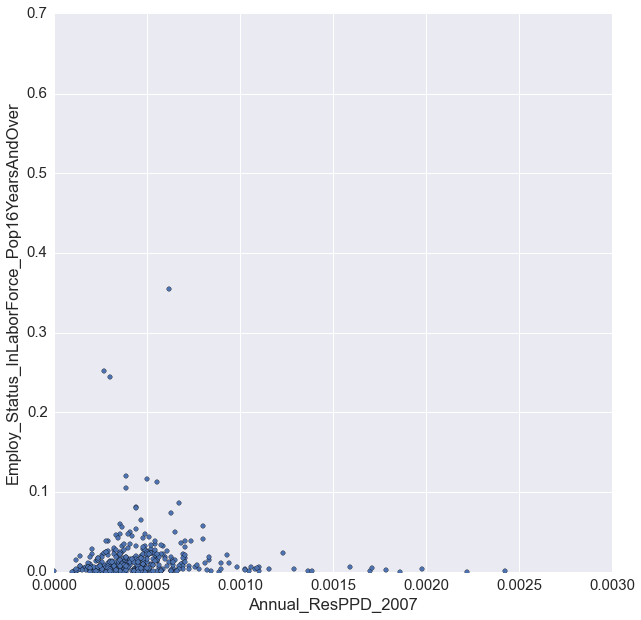

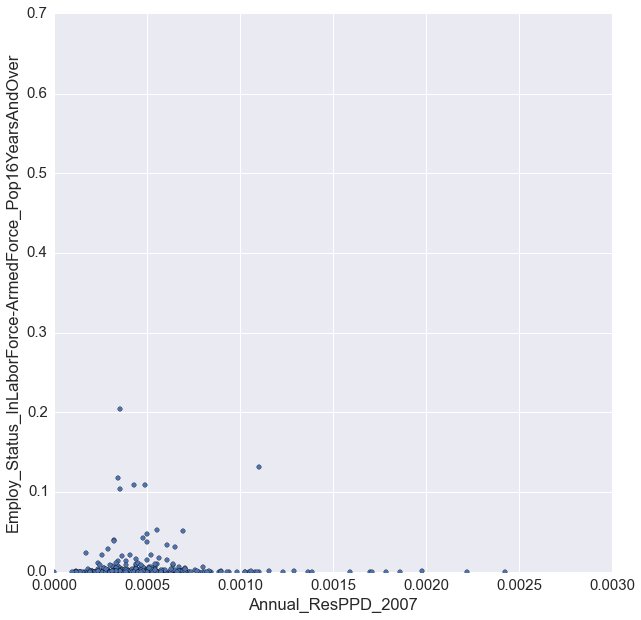

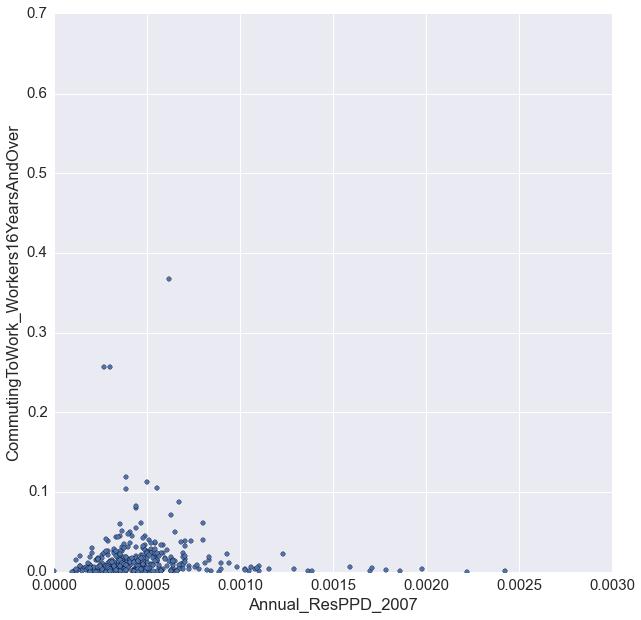

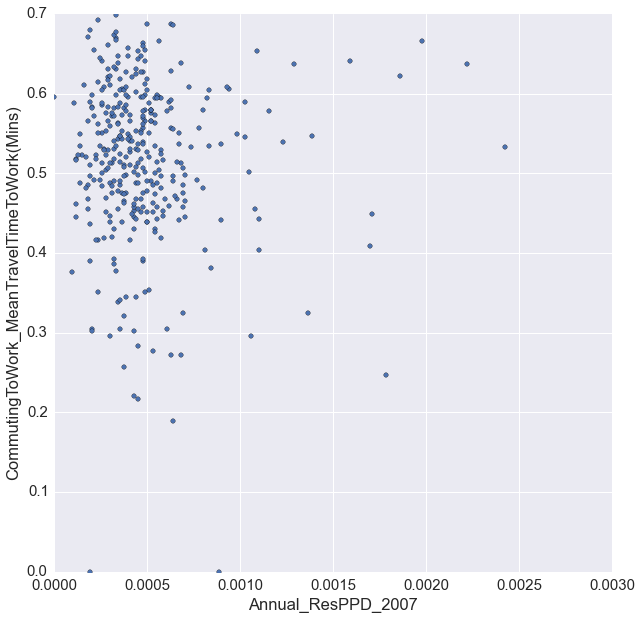

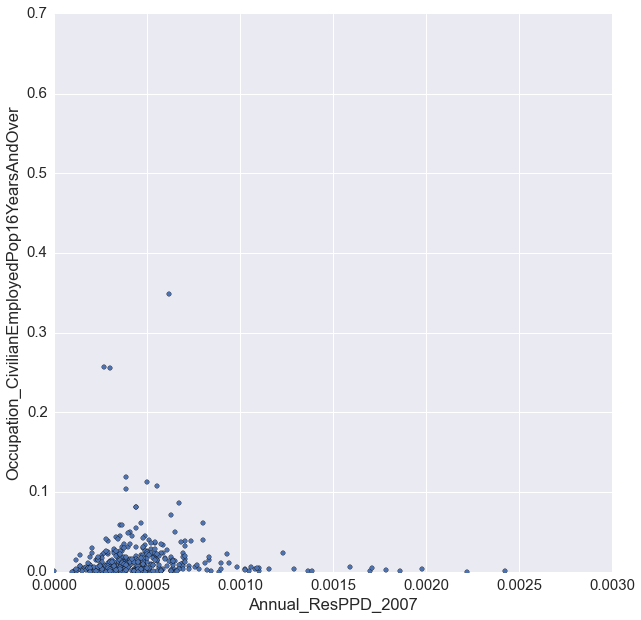

...

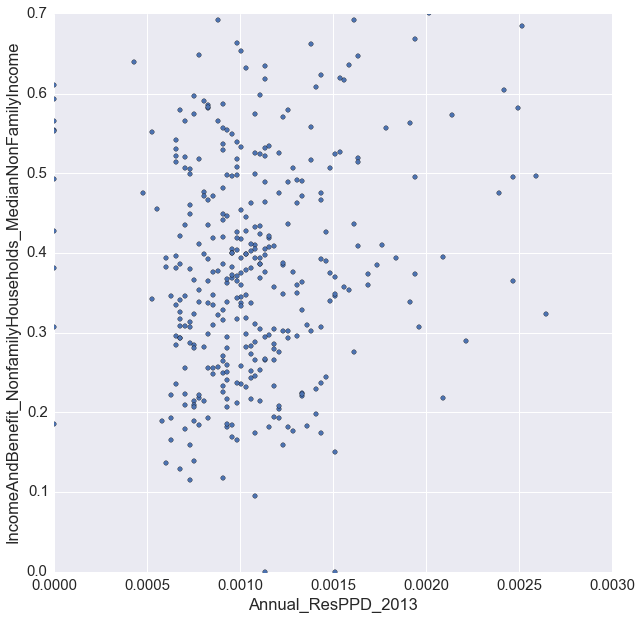

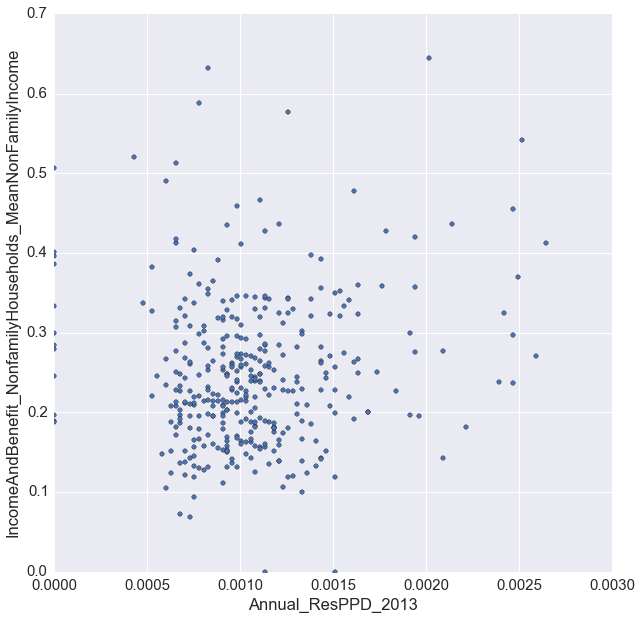

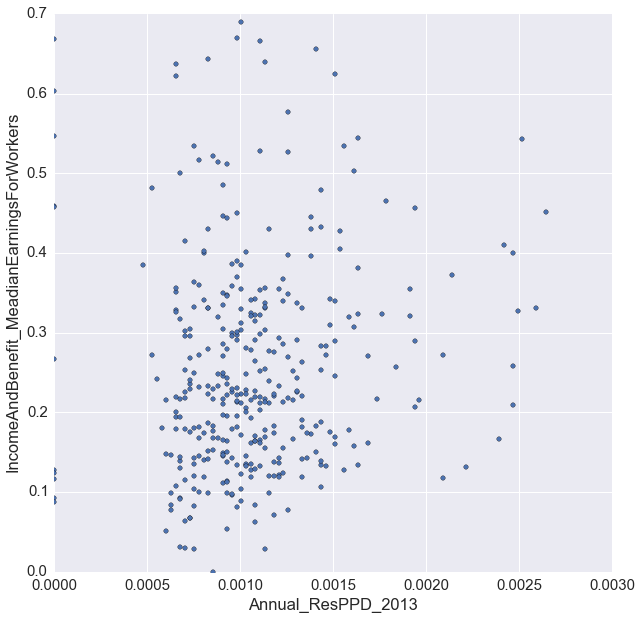

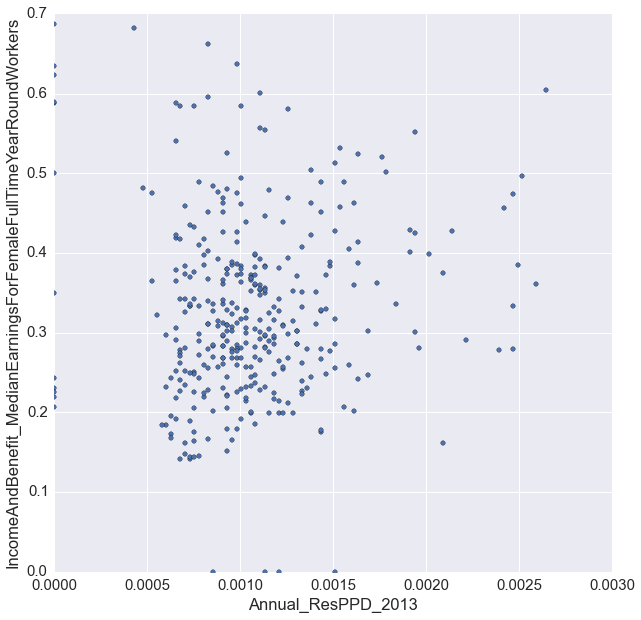

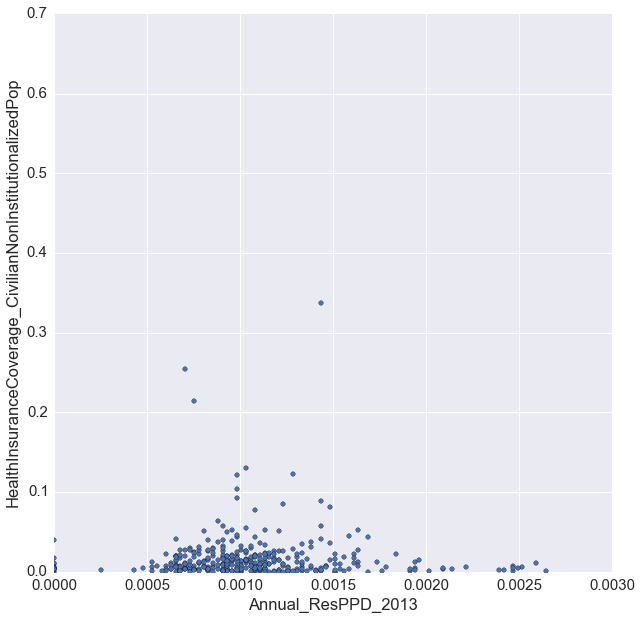

In [65]:
# for (col1, col2, col3) in df3:
plt.rcParams['figure.figsize'] = (10, 10)
for col1, col2 in [(col1, col2) for col1 in target_res_col_list for col2 in other_col_list]:
    df_normalized.plot(kind='scatter', x=col1, y=col2)
    
#     sns.jointplot(x=col1, y=col2, data=df_normalized, xlim={0.2,0}, ylim={0.2,0});
    plt.xlim(0,0.003)
    plt.ylim(0,0.7)
    
#     sns.lmplot(x=col1, y=col2, data=new_df, size=7) #hue="County", col="County"
#     plt.title('Correlation Value: %s' % col3 )

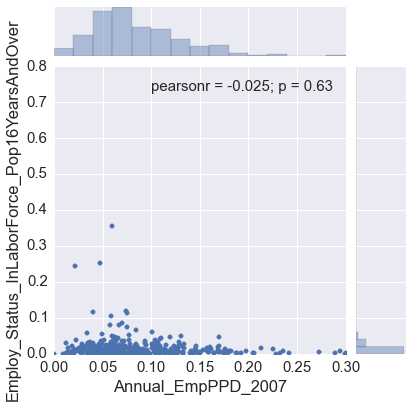

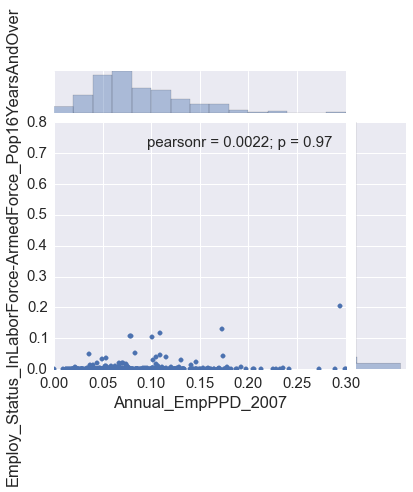

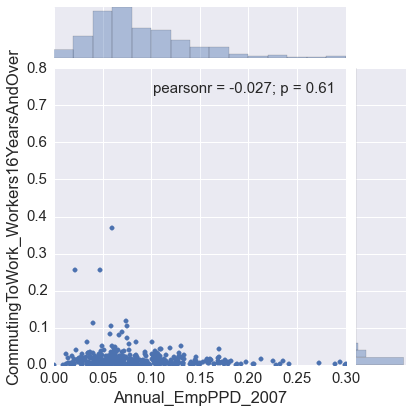

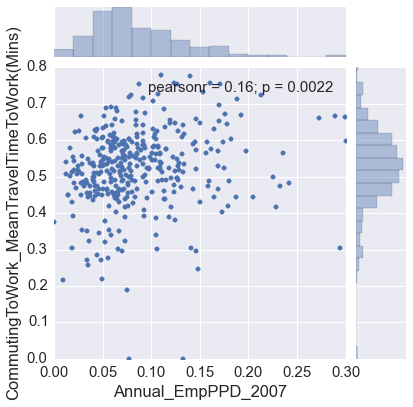

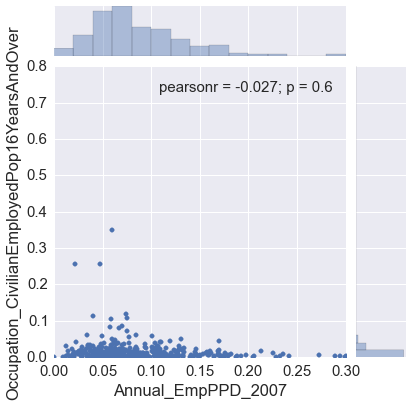

...

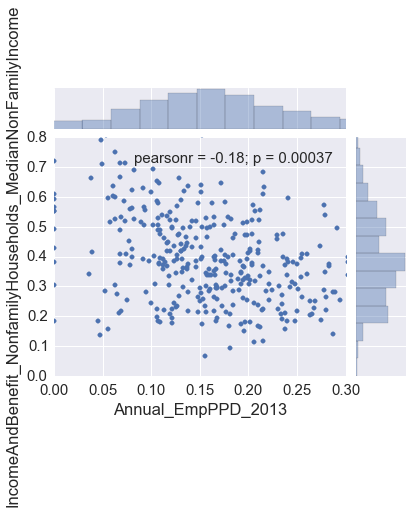

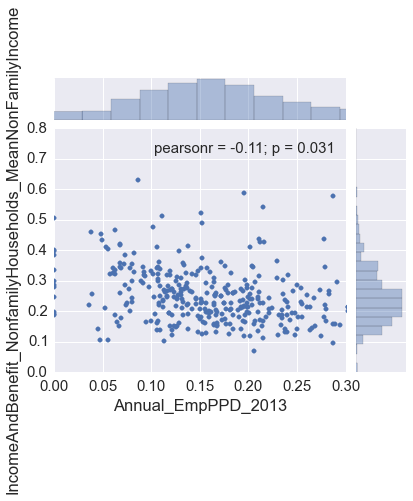

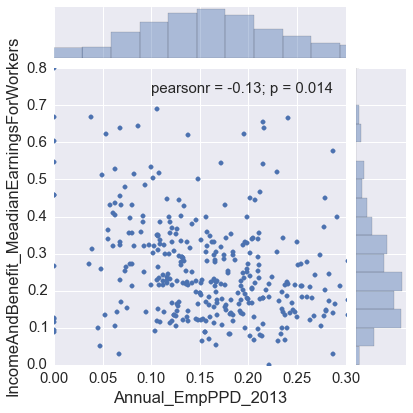

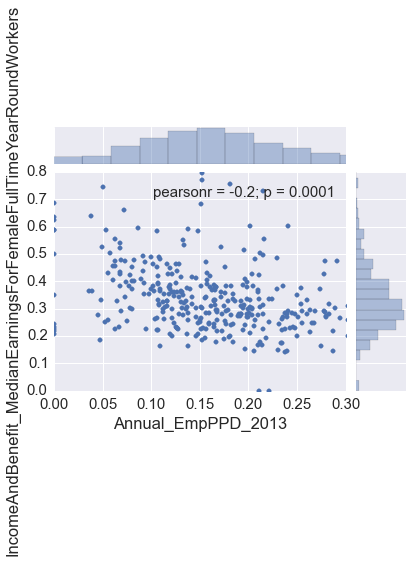

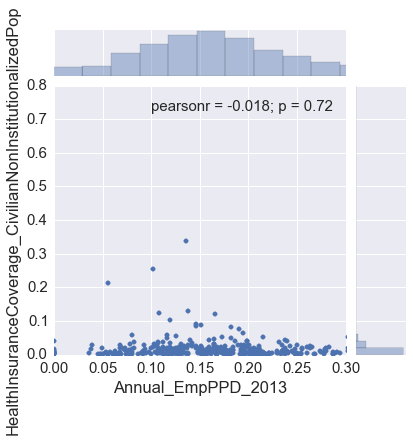

In [67]:
# for (col1, col2, col3) in df3:
plt.rcParams['figure.figsize'] = (10, 10)
for col1, col2 in [(col1, col2) for col1 in target_emp_col_list for col2 in other_col_list]:
#     df_normalized.plot(kind='scatter', x=col1, y=col2)
    
    sns.jointplot(x=col1, y=col2, data=df_normalized, xlim={0.3,0}, ylim={0.8,0});
#     plt.xlim(0,0.0001)
#     plt.ylim(0,0.7)
    
#     sns.lmplot(x=col1, y=col2, data=new_df, size=7) #hue="County", col="County"
#     plt.title('Correlation Value: %s' % col3 )